In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

In [2]:
airbnb_info = pd.read_csv("AB_NYC_2019.csv")
airbnb_info.head(20)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [3]:
airbnb_info.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [4]:
len(airbnb_info)

48895

In [5]:
airbnb_info.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [6]:
airbnb_info.drop(['host_name','last_review'], axis=1, inplace=True)
airbnb_info.head(10)

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,0.59,1,129
6,5121,BlissArtsSpace!,7356,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,1.33,4,188


In [7]:
airbnb_info.fillna({'reviews_per_month':0}, inplace=True)
airbnb_info.reviews_per_month.isnull().sum()

0

In [8]:
airbnb_info.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [9]:
airbnb_info.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [10]:
airbnb_info.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [11]:
brooklyn=airbnb_info.loc[airbnb_info['neighbourhood_group'] == 'Brooklyn']
price_brooklyn=brooklyn[['price']]
Manhattan=airbnb_info.loc[airbnb_info['neighbourhood_group'] == 'Manhattan']
price_manhattan=Manhattan[['price']]
Queens=airbnb_info.loc[airbnb_info['neighbourhood_group'] == 'Queens']
price_queens=Queens[['price']]
SI=airbnb_info.loc[airbnb_info['neighbourhood_group'] == 'Staten Island']
price_si=SI[['price']]
Bronx=airbnb_info.loc[airbnb_info['neighbourhood_group'] == 'Bronx']
price_bronx=Bronx[['price']]

price_list_by_n=[price_brooklyn, price_manhattan, price_queens, price_si, price_bronx]

In [15]:
countList=[]

neighbourList=['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']

for x in price_list_by_n:
    i=x.describe(percentiles=[.25, .50, .75])
    i=i.iloc[3:]
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Precentage'}, inplace=True)
    countList.append(i)   
countList[0].rename(columns={'price':neighbourList[0]}, inplace=True)
countList[1].rename(columns={'price':neighbourList[1]}, inplace=True)
countList[2].rename(columns={'price':neighbourList[2]}, inplace=True)
countList[3].rename(columns={'price':neighbourList[3]}, inplace=True)
countList[4].rename(columns={'price':neighbourList[4]}, inplace=True) 
newdf=countList
newdf=[df.set_index('Precentage') for df in newdf]
newdf=newdf[0].join(newdf[1:])
newdf

,Brooklyn,Manhattan,Queens,Staten Island,Bronx
Precentage,,,,,
min,0.0,0.0,10.0,13.0,0.0
25%,60.0,95.0,50.0,50.0,45.0
50%,90.0,150.0,75.0,75.0,65.0
75%,150.0,220.0,110.0,110.0,99.0
max,10000.0,10000.0,10000.0,5000.0,2500.0


Text(0.5, 1.0, 'Distribution of prices for each neighberhood_group')

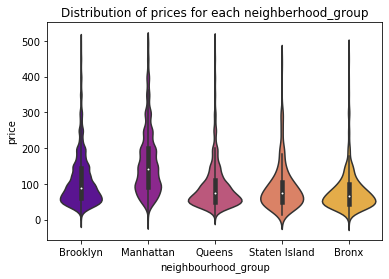

In [16]:
Price=airbnb_info[airbnb_info.price < 500]

viz_2=sns.violinplot(data=Price, x='neighbourhood_group', y='price',palette="plasma")
viz_2.set_title('Distribution of prices for each neighberhood_group')

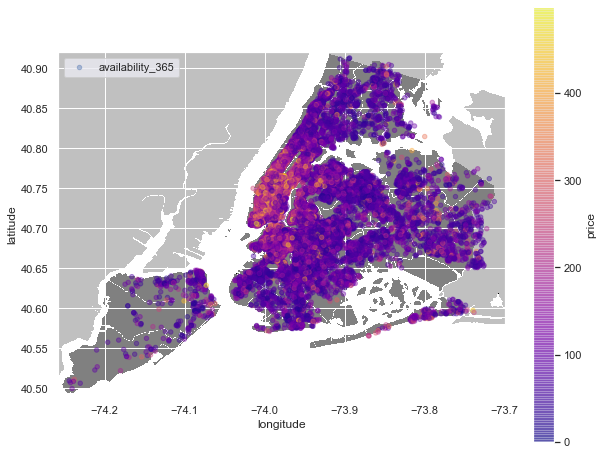

In [17]:
import urllib
plt.figure(figsize=(10,8))
i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread(i) output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
Price.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price', ax=ax, 
           cmap='plasma', colorbar=True, alpha=0.4, zorder=5)
plt.legend()
plt.show()

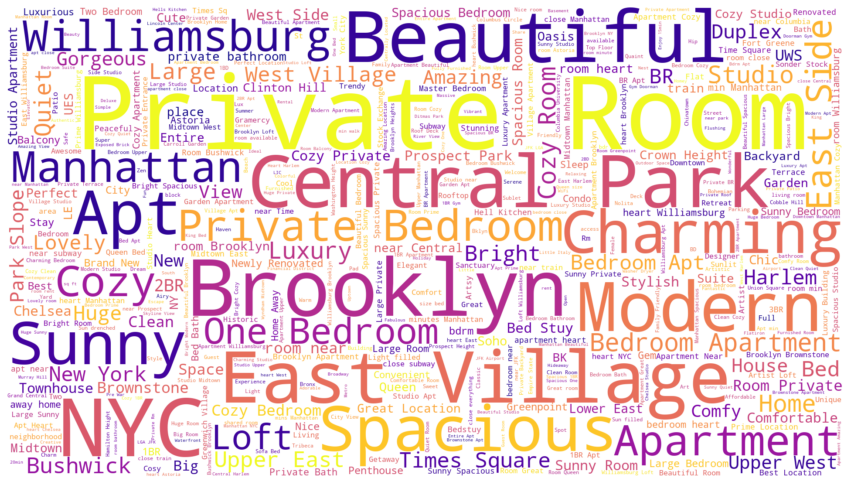

In [18]:
from wordcloud import WordCloud, ImageColorGenerator
text = " ".join(str(each) for each in airbnb_info.name)
wordcloud = WordCloud(max_words=500, background_color="white",width = 1920,height =1080,colormap="plasma").generate(text)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Index(['id', 'name', 'host_id', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

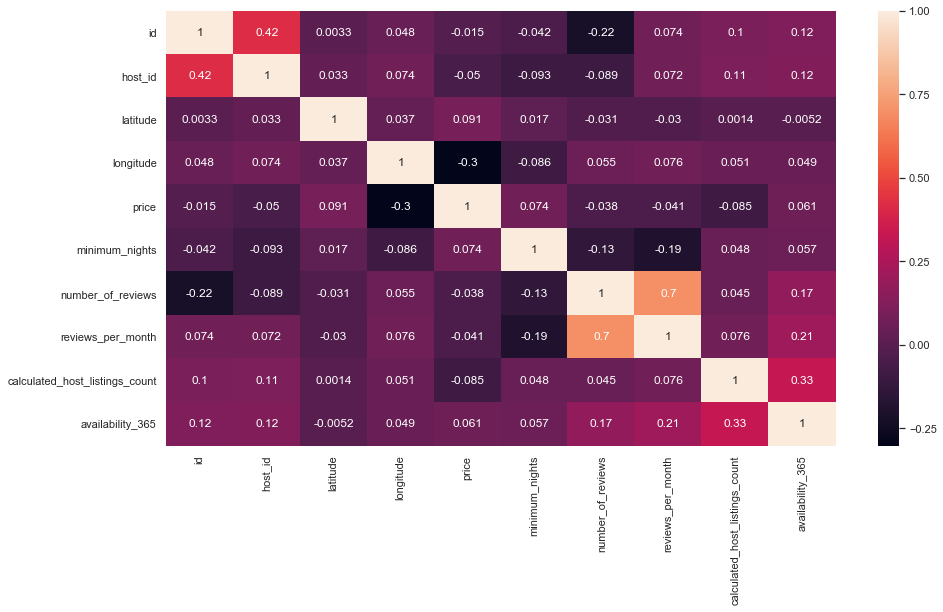

In [26]:
corr = airbnb_info.corr(method='kendall')
plt.figure(figsize=(15,8))
ax=sns.heatmap(corr, annot=True)
ax.set_ylim([10, 0])
airbnb_info.columns


Text(0.5, 1.0, 'Neighbourhood Group')

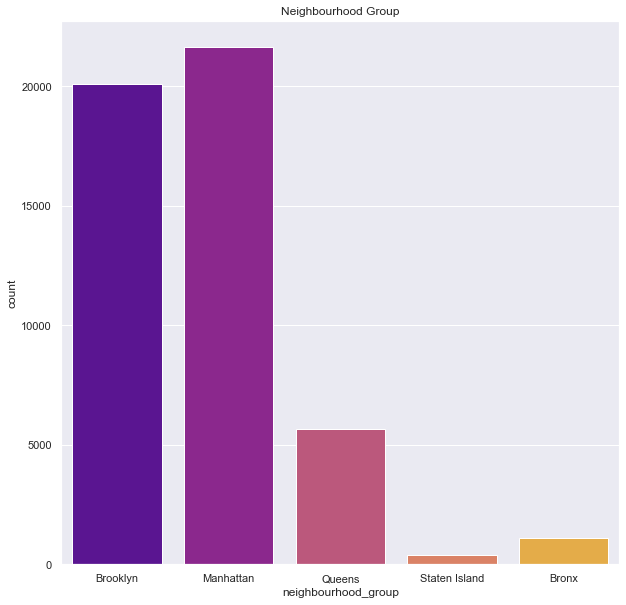

In [22]:
sns.countplot(airbnb_info['neighbourhood_group'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Neighbourhood')

Text(0.5, 1.0, 'Neighbourhood')

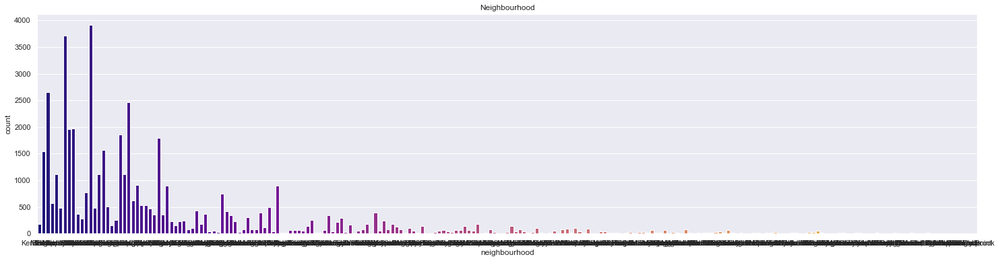

In [23]:
sns.countplot(airbnb_info['neighbourhood'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(25,6)
plt.title('Neighbourhood')

Text(0.5, 1.0, 'Restaurants delivering online or Not')

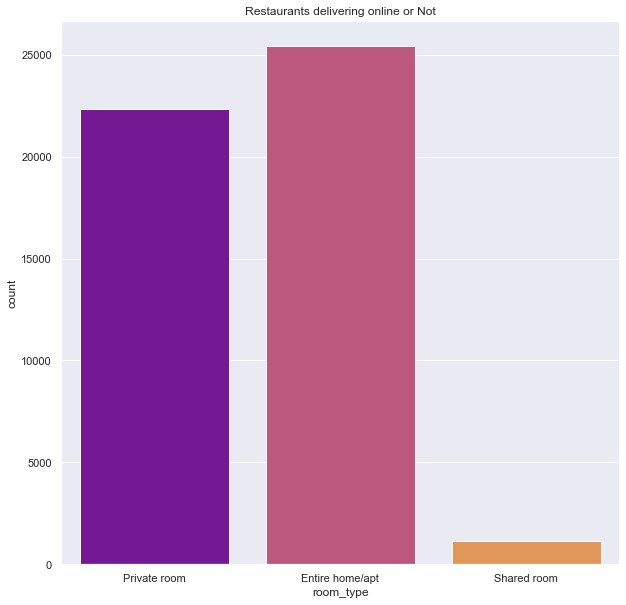

In [24]:
sns.countplot(airbnb_info['room_type'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Counts of the types of the room')

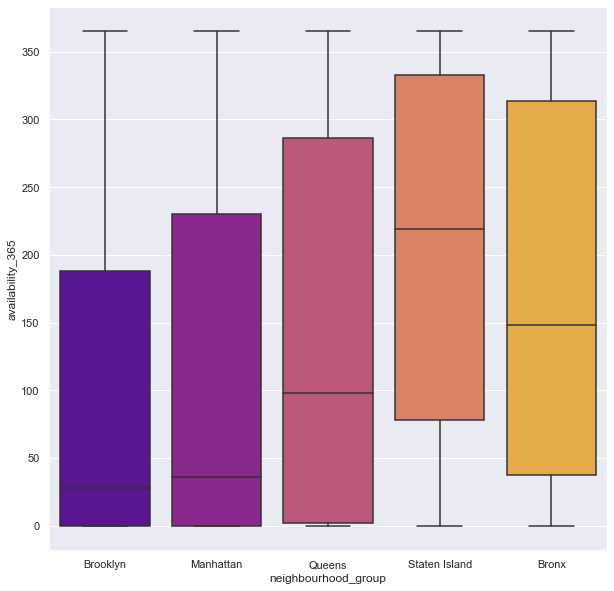

In [25]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=airbnb_info, x='neighbourhood_group',y='availability_365',palette='plasma')

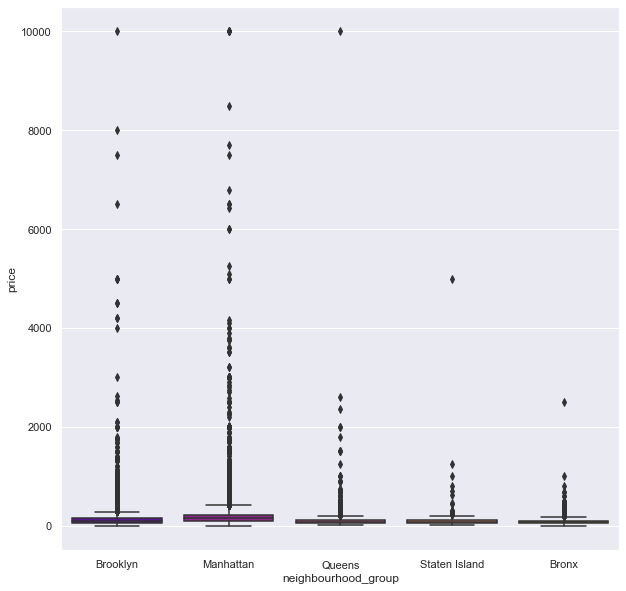

In [26]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=airbnb_info, x='neighbourhood_group',y='price',palette='plasma')

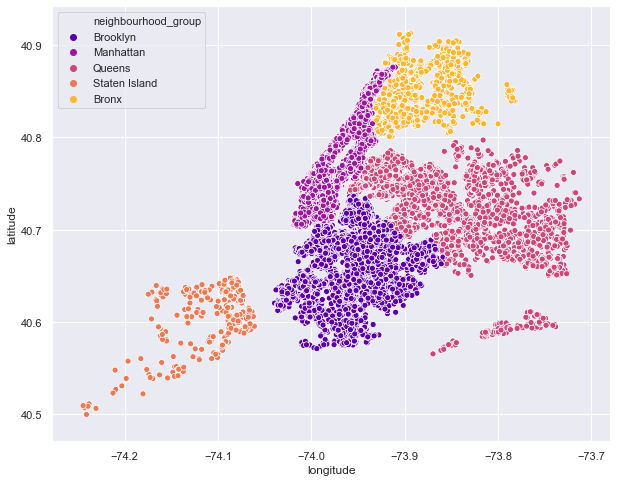

In [27]:
plt.figure(figsize=(10,8))
sns.scatterplot(airbnb_info.longitude,airbnb_info.latitude,hue=airbnb_info.neighbourhood_group,palette='plasma')
plt.ioff()

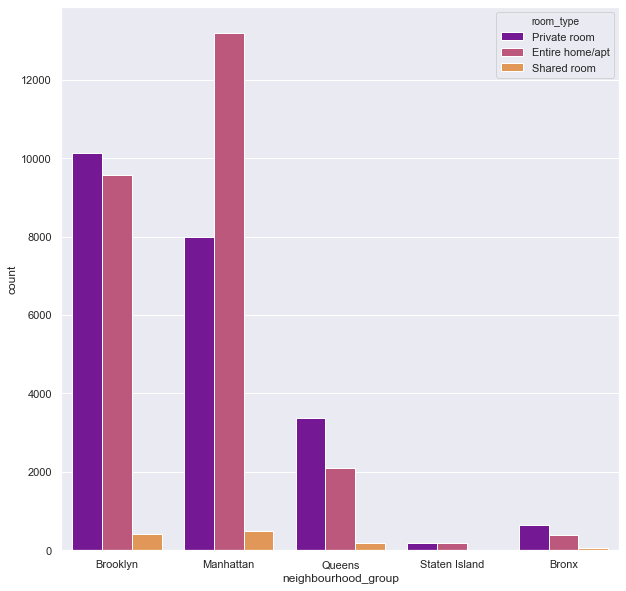

In [27]:
plt.figure(figsize=(10,10))
ax = sns.countplot(airbnb_info['neighbourhood_group'],palette="plasma",hue=airbnb_info['room_type'])

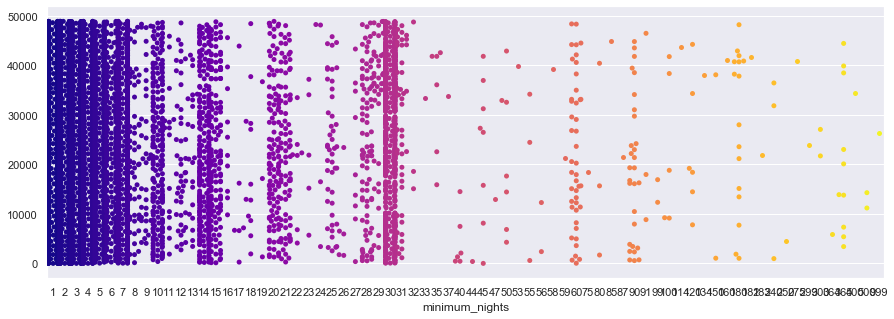

In [17]:
df1 = airbnb_info[airbnb_info.room_type=="Private room"]['minimum_nights']
f,ax = plt.subplots(figsize=(15,5))
ax = sns.swarmplot(y= df1.index,x= df1.values,palette="plasma")
plt.xlabel("minimum_nights")
plt.show()

In [30]:
import folium
from folium.plugins import HeatMap
m=folium.Map([40.7128,-74.0060],zoom_start=11)
HeatMap(airbnb_info[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

In [31]:
airbnb_info.corr().style.background_gradient(cmap='coolwarm')

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1,0.58829,-0.00312529,0.0909085,0.0106187,-0.0132245,-0.31976,0.180221,0.133272,0.0854676
host_id,0.58829,1,0.0202242,0.127055,0.0153091,-0.0173643,-0.140106,0.209783,0.15495,0.203492
latitude,-0.00312529,0.0202242,1,0.0847884,0.0339387,0.0248693,-0.0153888,-0.0187577,0.0195174,-0.0109835
longitude,0.0909085,0.127055,0.0847884,1,-0.150019,-0.0627471,0.0590943,0.138516,-0.114713,0.0827307
price,0.0106187,0.0153091,0.0339387,-0.150019,1,0.0427993,-0.0479542,-0.0505641,0.0574717,0.0818288
minimum_nights,-0.0132245,-0.0173643,0.0248693,-0.0627471,0.0427993,1,-0.0801161,-0.124905,0.12796,0.144303
number_of_reviews,-0.31976,-0.140106,-0.0153888,0.0590943,-0.0479542,-0.0801161,1,0.589407,-0.0723761,0.172028
reviews_per_month,0.180221,0.209783,-0.0187577,0.138516,-0.0505641,-0.124905,0.589407,1,-0.0473121,0.163732
calculated_host_listings_count,0.133272,0.15495,0.0195174,-0.114713,0.0574717,0.12796,-0.0723761,-0.0473121,1,0.225701
availability_365,0.0854676,0.203492,-0.0109835,0.0827307,0.0818288,0.144303,0.172028,0.163732,0.225701,1


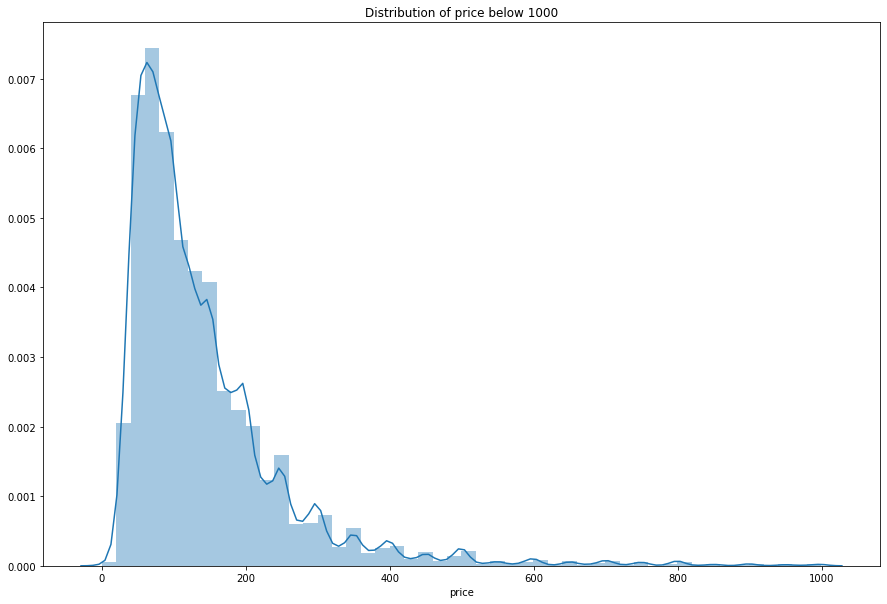

In [18]:
plt.figure(figsize=(15,10))
sns.distplot(airbnb_info[airbnb_info.price<1000].price)
plt.title('Distribution of price below 1000')
plt.show()

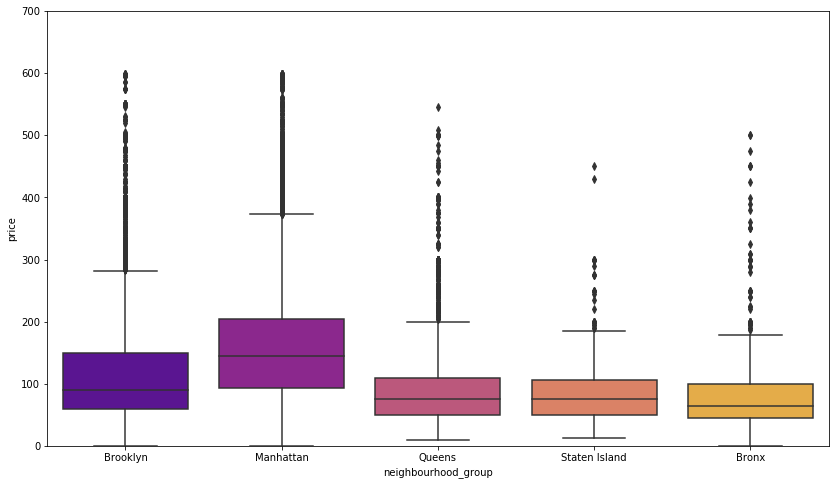

In [19]:
plt.figure(figsize=(14,8))
sns.boxplot(airbnb_info.neighbourhood_group,airbnb_info[airbnb_info.price<600].price,palette='plasma')
plt.ylim(0,700)
plt.show()

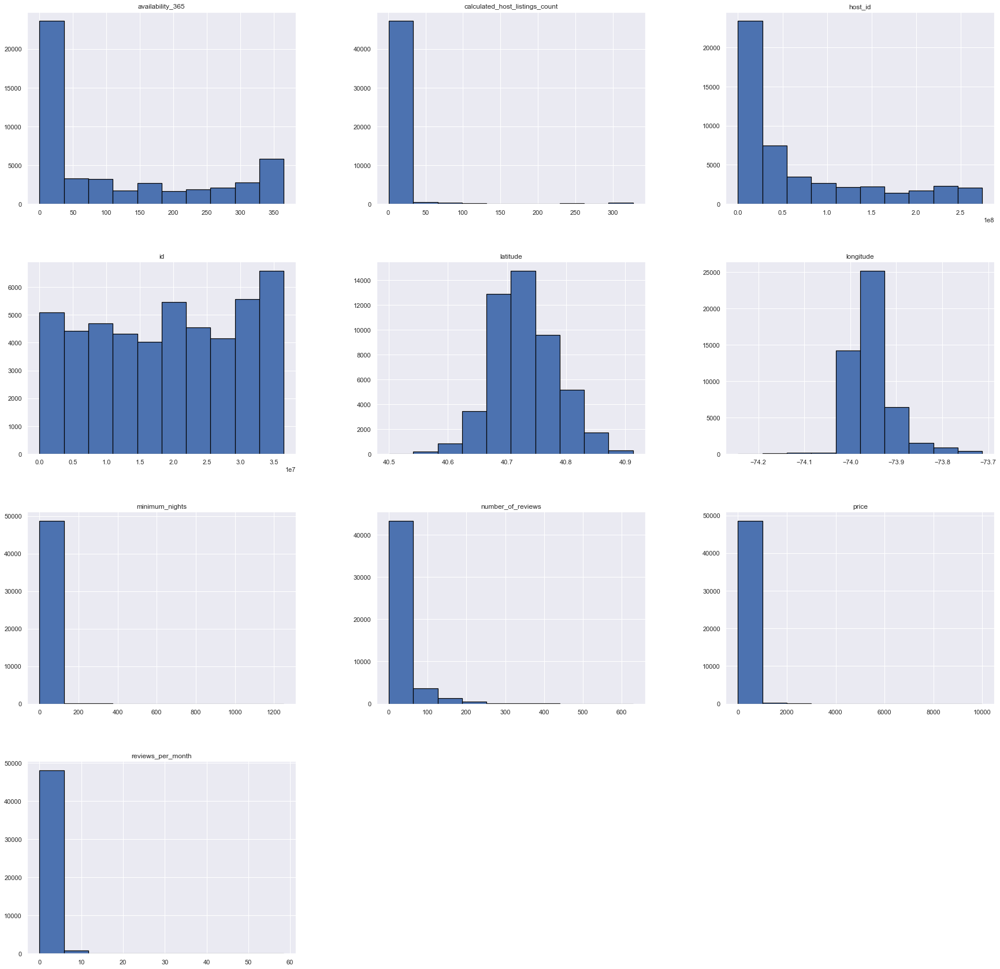

In [34]:
airbnb_info.hist(edgecolor="black", linewidth=1.5, figsize=(50, 50));

<Figure size 2160x2160 with 0 Axes>

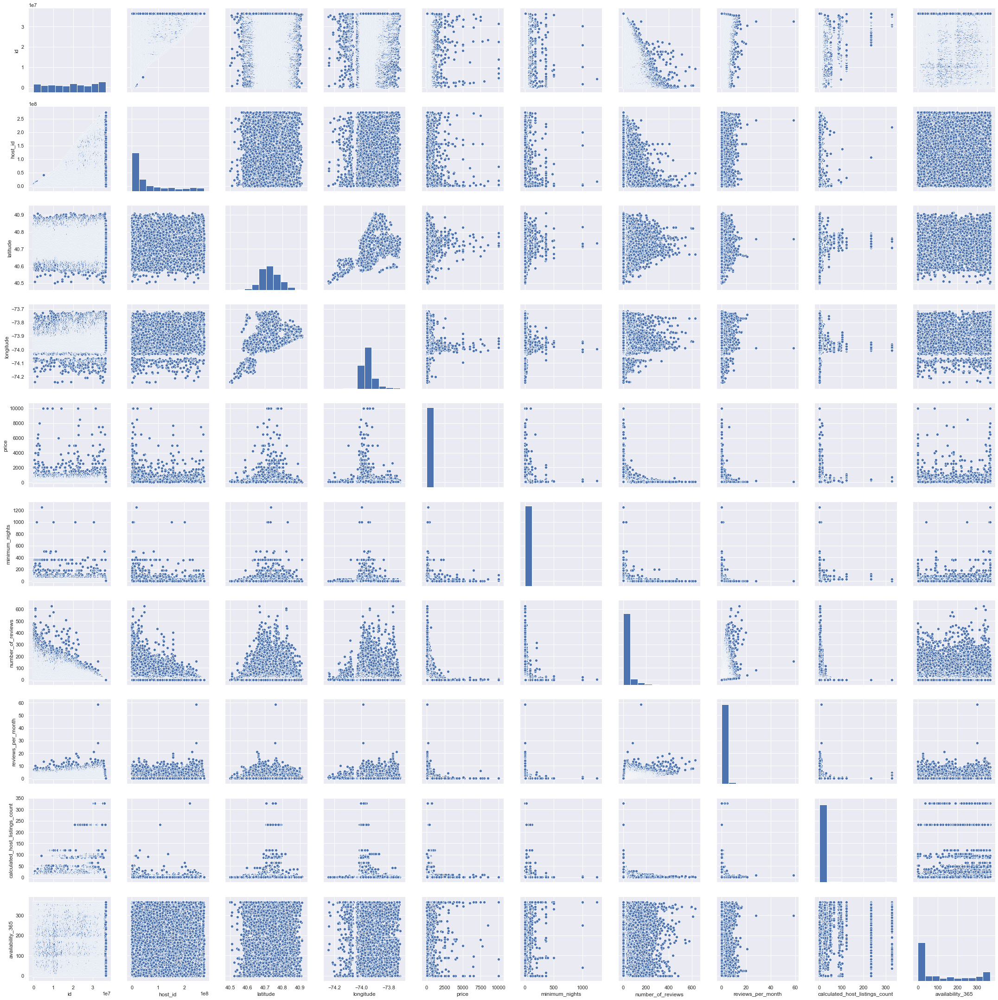

In [19]:
plt.figure(figsize=(30, 30))
sns.pairplot(airbnb_info, height=3, diag_kind="hist",palette="plasma")

In [37]:
import plotly.express as px
fig = px.scatter_mapbox(airbnb_info, 
                        lat="latitude", 
                        lon="longitude", 
                        color="neighbourhood", 
                        size="price",
                        color_continuous_scale=px.colors.cyclical.IceFire, 
                        size_max=30, 
                        opacity = .70,
                        zoom=10,
                       )
fig.layout.mapbox.style = 'carto-positron'
fig.update_layout(title_text = 'NYC Airbnb by Neighbourhood', height = 800)

fig.show()

Note that the cells below is about deep learning model.
(However, we encounted some unexpected errors which prevented us from running it. But all the codes and models have already been written as shown in the below section, including feature engineering and neural network architecture.)

In [12]:
import torch 
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder

airbnb_info.head(10)
airbnb_info.drop(['id','name',"host_id","availability_365"], axis=1, inplace=True)

In [13]:
airbnb_info.drop(['minimum_nights','reviews_per_month',"calculated_host_listings_count"], axis=1, inplace=True)

In [14]:
airbnb_info.head(10)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,9
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,45
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,0
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,270
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,9
5,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,74
6,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,49
7,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,430
8,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,118
9,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,160


In [15]:
airbnb_info.drop(["neighbourhood_group"], axis=1, inplace=True)

In [16]:
airbnb_info.head(10)

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
0,Kensington,40.64749,-73.97237,Private room,149,9
1,Midtown,40.75362,-73.98377,Entire home/apt,225,45
2,Harlem,40.80902,-73.94190,Private room,150,0
3,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,270
4,East Harlem,40.79851,-73.94399,Entire home/apt,80,9
5,Murray Hill,40.74767,-73.97500,Entire home/apt,200,74
6,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,49
7,Hell's Kitchen,40.76489,-73.98493,Private room,79,430
8,Upper West Side,40.80178,-73.96723,Private room,79,118
9,Chinatown,40.71344,-73.99037,Entire home/apt,150,160


In [17]:
airbnb_info.room_type.replace({"Shared room":0,"Private room":1,"Entire home/apt":2}, inplace=True)

In [18]:
airbnb_info.head(100)

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
0,Kensington,40.64749,-73.97237,1,149,9
1,Midtown,40.75362,-73.98377,2,225,45
2,Harlem,40.80902,-73.94190,1,150,0
3,Clinton Hill,40.68514,-73.95976,2,89,270
4,East Harlem,40.79851,-73.94399,2,80,9
...,...,...,...,...,...,...
95,Bushwick,40.70093,-73.92609,2,105,118
96,Upper West Side,40.79764,-73.96177,2,140,81
97,Harlem,40.82803,-73.94731,1,89,1
98,Chelsea,40.74008,-74.00271,1,98,30


In [19]:
order = ['neighbourhood', 'latitude', 'longitude', 'room_type', 'number_of_reviews','price']
airbnb_info = airbnb_info[order]


In [20]:
airbnb_info.drop(["number_of_reviews"], axis=1, inplace=True)

In [21]:
airbnb_info

,neighbourhood,latitude,longitude,room_type,price
0,Kensington,40.64749,-73.97237,1,149
1,Midtown,40.75362,-73.98377,2,225
2,Harlem,40.80902,-73.94190,1,150
3,Clinton Hill,40.68514,-73.95976,2,89
4,East Harlem,40.79851,-73.94399,2,80
...,...,...,...,...,...
48890,Bedford-Stuyvesant,40.67853,-73.94995,1,70
48891,Bushwick,40.70184,-73.93317,1,40
48892,Harlem,40.81475,-73.94867,2,115
48893,Hell's Kitchen,40.75751,-73.99112,0,55


In [24]:
Lmin = airbnb_info.latitude.min()
Lmax = airbnb_info.latitude.max()
Omin = airbnb_info.longitude.min()
Omax =airbnb_info.longitude.max()

airbnb_info['latitude'] = airbnb_info['latitude'].map(lambda x: (x-Lmin)*1.0/(Lmax-Lmin))
airbnb_info['longitude'] = airbnb_info['longitude'].map(lambda x: (x-Omin)*1.0/(Omax-Omin))

In [29]:
encoded_df = airbnb_info.apply(LabelEncoder().fit_transform)
encoded_df.head()

,neighbourhood,latitude,longitude,room_type,price
0,108,2025,4568,1,138
1,127,11521,3450,2,214
2,94,16012,7576,1,139
3,41,4964,5791,2,78
4,61,15154,7367,2,69


In [34]:
airbnb_info.head(5)

cols = list(set(airbnb_info.select_dtypes([np.object]).columns) - set(['price']))
onehot_df = pd.get_dummies(airbnb_info, columns=cols)
onehot_df.head()


,latitude,longitude,room_type,price,neighbourhood_Allerton,neighbourhood_Arden Heights,neighbourhood_Arrochar,neighbourhood_Arverne,neighbourhood_Astoria,neighbourhood_Bath Beach,...,neighbourhood_Westerleigh,neighbourhood_Whitestone,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside
0,0.357393,0.511921,1,149,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.614199,0.490469,2,225,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.748252,0.569257,1,150,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.448496,0.535649,2,89,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.722820,0.565324,2,80,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
onehot_df.price[onehot_df.price<50]=0

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [37]:
onehot_df

,latitude,longitude,room_type,price,neighbourhood_Allerton,neighbourhood_Arden Heights,neighbourhood_Arrochar,neighbourhood_Arverne,neighbourhood_Astoria,neighbourhood_Bath Beach,...,neighbourhood_Westerleigh,neighbourhood_Whitestone,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside
0,0.357393,0.511921,1,149,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.614199,0.490469,2,225,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.748252,0.569257,1,150,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.448496,0.535649,2,89,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.722820,0.565324,2,80,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,0.432502,0.554109,1,70,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48891,0.488906,0.585684,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48892,0.762117,0.556517,2,115,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48893,0.623612,0.476639,0,55,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
onehot_df.price[onehot_df.price==0]=1111111

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [42]:
onehot_df.price[onehot_df.price<100]=2222222
onehot_df.price[onehot_df.price<200]=3333333
onehot_df.price[onehot_df.price<300]=4444444
onehot_df.price[onehot_df.price<400]=5555555
onehot_df.price[onehot_df.price<500]=6666666
onehot_df.price[onehot_df.price<100000]=7777777


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Anac

In [43]:
onehot_df

,latitude,longitude,room_type,price,neighbourhood_Allerton,neighbourhood_Arden Heights,neighbourhood_Arrochar,neighbourhood_Arverne,neighbourhood_Astoria,neighbourhood_Bath Beach,...,neighbourhood_Westerleigh,neighbourhood_Whitestone,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside
0,0.357393,0.511921,1,3333333,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.614199,0.490469,2,4444444,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.748252,0.569257,1,3333333,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.448496,0.535649,2,2222222,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.722820,0.565324,2,2222222,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,0.432502,0.554109,1,2222222,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48891,0.488906,0.585684,1,1111111,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48892,0.762117,0.556517,2,3333333,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48893,0.623612,0.476639,0,2222222,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
onehot_df.price[onehot_df.price==1111111]=0
onehot_df.price[onehot_df.price==2222222]=1
onehot_df.price[onehot_df.price==3333333]=2
onehot_df.price[onehot_df.price==4444444]=3 
onehot_df.price[onehot_df.price==5555555]=4 
onehot_df.price[onehot_df.price==6666666]=5 
onehot_df.price[onehot_df.price==7777777]=6 

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Anac

In [45]:
onehot_df.head(20)

,latitude,longitude,room_type,price,neighbourhood_Allerton,neighbourhood_Arden Heights,neighbourhood_Arrochar,neighbourhood_Arverne,neighbourhood_Astoria,neighbourhood_Bath Beach,...,neighbourhood_Westerleigh,neighbourhood_Whitestone,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside
0,0.357393,0.511921,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.614199,0.490469,2,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.748252,0.569257,1,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.448496,0.535649,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.722820,0.565324,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0.599802,0.506972,2,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0.452706,0.542800,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0.641469,0.488286,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0.730733,0.521593,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0.516974,0.478050,2,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
prep = list(onehot_df.columns)
del prep[5]
X = onehot_df[prep].values
Y = onehot_df[['price']].values

In [48]:
Y

array([[2],
       [3],
       [2],
       ...,
       [2],
       [1],
       [1]], dtype=int64)

In [49]:
X.shape[0]

array([[0.35739347, 0.51192067, 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.61419895, 0.49046911, 2.        , ..., 0.        , 0.        ,
        0.        ],
       [0.74825175, 0.56925653, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.76211678, 0.55651732, 2.        , ..., 0.        , 0.        ,
        0.        ],
       [0.62361168, 0.4766385 , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.63941249, 0.48000677, 1.        , ..., 0.        , 0.        ,
        0.        ]])

In [142]:
class MLP(torch.nn.Module):
    def __init__(self):
        super(MLP,self).__init__()
        self.fc1 = torch.nn.Linear(224,128)
        self.fc2 = torch.nn.Linear(128,64)
        self.fc3 = torch.nn.Linear(64,32)
        self.fc4 = torch.nn.Linear(32,7)
        
    def forward(self,din):
        print("din",din.shape)
        dout = torch.nn.functional.relu(self.fc1(din))
        dout = torch.nn.functional.relu(self.fc2(dout))
        dout = torch.nn.functional.relu(self.fc3(dout))
        return torch.nn.functional.softmax(self.fc4(dout))
model = MLP()
print(model)

MLP(
  (fc1): Linear(in_features=224, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=32, bias=True)
  (fc4): Linear(in_features=32, out_features=7, bias=True)
)


In [143]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=88, stratify=Y)

In [144]:
X_train.shape[0]

34226

In [152]:
from torch.autograd import Variable
import torch.nn.functional as F


optimizer = torch.optim.SGD(model.parameters(),lr=0.01,momentum=0.9)
lossfunc = torch.nn.CrossEntropyLoss()

EPOCH = 20

def AccuarcyCompute(pred,label):
    test_np = (np.argmax(pred,1) == label)
    test_np = np.float32(test_np)
    return np.mean(test_np)

model.train()

for x in range(20):
    for i in range(X_train.shape[0]):
    
        optimizer.zero_grad()
        
        new_label = np.array([0,0,0,0,0,0,0])
        new_label[int(Y_train[i][0])] = 1
        
        tensor_data_x = torch.from_numpy(X_train[i]).double().view(-1,224)
        tensor_data_y = torch.from_numpy(new_label).double().view(-1,7)
        
        inputs=Variable(tensor_data_x).float()
        new_label=Variable(tensor_data_y).float()

        print(inputs)
        print(new_label)
        
        outputs = model(inputs)
        new_label = new_label
        
        print(outputs)
        print(new_label)
        
        loss = lossfunc(outputs,new_label)
        loss.backward()
    
        optimizer.step()
    
        if i % 100 == 0:
            print(i,":",AccuarcyCompute(outputs,new_label))

tensor([[0.8913, 0.6031, 1.0000, 1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 1.0000, 0.0000,
         0.0000, 0.0000, 0.0

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  


tensor([[0.1323, 0.1452, 0.1436, 0.1484, 0.1469, 0.1585, 0.1251]],
       grad_fn=<SoftmaxBackward>)
tensor([[0., 1., 0., 0., 0., 0., 0.]])


RuntimeError: Expected object of scalar type Long but got scalar type Float for argument #2 'target' in call to _thnn_nll_loss_forward